In [1]:
from datetime import datetime

import natsort

from scipy.stats import mannwhitneyu, wilcoxon
from VD_A import VD_A
import itertools

import pandas as pd
pd.set_option("display.max_columns", None)

import holoviews as hv

import hvplot.pandas  # noqa
hvplot.extension('bokeh')  # This call loads the Matplotlib (the active one) and Plotly extensions.

import panel as pn

from pathlib import Path
import itertools
import functools
import re

In [2]:
paper_base = Path("~/Dropbox/Apps/Overleaf/kNN-Averaging @ Applied Soft Computing 2022").expanduser()
paper_tables = paper_base / "generated/tables"
paper_tables.mkdir(parents=True, exist_ok=True)
assert paper_tables.exists()
paper_figures = paper_base / "generated/figures"
paper_figures.mkdir(parents=True, exist_ok=True)
assert paper_figures.exists()

In [3]:
denoiser_to_latex = {
    "Noisy": r'$\mathtt{B}$',
    "R5": r'$\mathtt{Rep}_{5}$',
    "R10": r'$\mathtt{Rep}_{10}$',
    "R50": r'$\mathtt{Rep}_{50}$',
    "R100": r'$\mathtt{Rep}_{100}$',
    "AccumulativeResampling": r'$\mathtt{EAR}$',
    "GPSS-mc2000": r'$\mathtt{GPSS}_{\text{2k}}$',
    "GPSS-mc4000": r'$\mathtt{GPSS}_{\text{4k}}$',
    
    'k5-MD0.1': r'$\mathtt{KNN}_{5}^{0.1}$',
    'k5-MD0.25': r'$\mathtt{KNN}_{5}^{0.25}$',
    'k5-MD0.5': r'$\mathtt{KNN}_{5}^{0.5}$',
    'k5-MD1': r'$\mathtt{KNN}_{5}^{1}$',
    'k10-MD0.1': r'$\mathtt{KNN}_{10}^{0.1}$',
    'k10-MD0.25': r'$\mathtt{KNN}_{10}^{0.25}$',
    'k10-MD0.5': r'$\mathtt{KNN}_{10}^{0.5}$',
    'k10-MD1': r'$\mathtt{KNN}_{10}^{1}$',
    'k20-MD0.1': r'$\mathtt{KNN}_{20}^{0.1}$',
    'k20-MD0.25': r'$\mathtt{KNN}_{20}^{0.25}$',
    'k20-MD0.5': r'$\mathtt{KNN}_{20}^{0.5}$',
    'k20-MD1': r'$\mathtt{KNN}_{20}^{1}$',
    'k50-MD0.1': r'$\mathtt{KNN}_{50}^{0.1}$',
    'k50-MD0.25': r'$\mathtt{KNN}_{50}^{0.25}$',
    'k50-MD0.5': r'$\mathtt{KNN}_{50}^{0.5}$',
    'k50-MD1': r'$\mathtt{KNN}_{50}^{1}$',
    'k100-MD0.1': r'$\mathtt{KNN}_{100}^{0.1}$',
    'k100-MD0.25': r'$\mathtt{KNN}_{100}^{0.25}$',
    'k100-MD0.5': r'$\mathtt{KNN}_{100}^{0.5}$',
    'k100-MD1': r'$\mathtt{KNN}_{100}^{1}$',
    'k500-MD0.1': r'$\mathtt{KNN}_{500}^{0.1}$',
    'k500-MD0.25': r'$\mathtt{KNN}_{500}^{0.25}$',
    'k500-MD0.5': r'$\mathtt{KNN}_{500}^{0.5}$',
    'k500-MD1': r'$\mathtt{KNN}_{500}^{1}$',
}

In [4]:
df = pd.read_pickle("benchmark-data.pkl")

# Example convergence plot for one specific (problem, noise, pop_size)

:Overlay
   .Area.I                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_B_right_curly_bracket                                                                                                         :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_5_right_curly_bracket_power_left_curly_bracket_0_full_stop_1_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_500_right_curly_bracket_power_left_curly_bracket_1_right_curly_bracket             :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_5_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                       :Curve   [n_eval]   (mean)
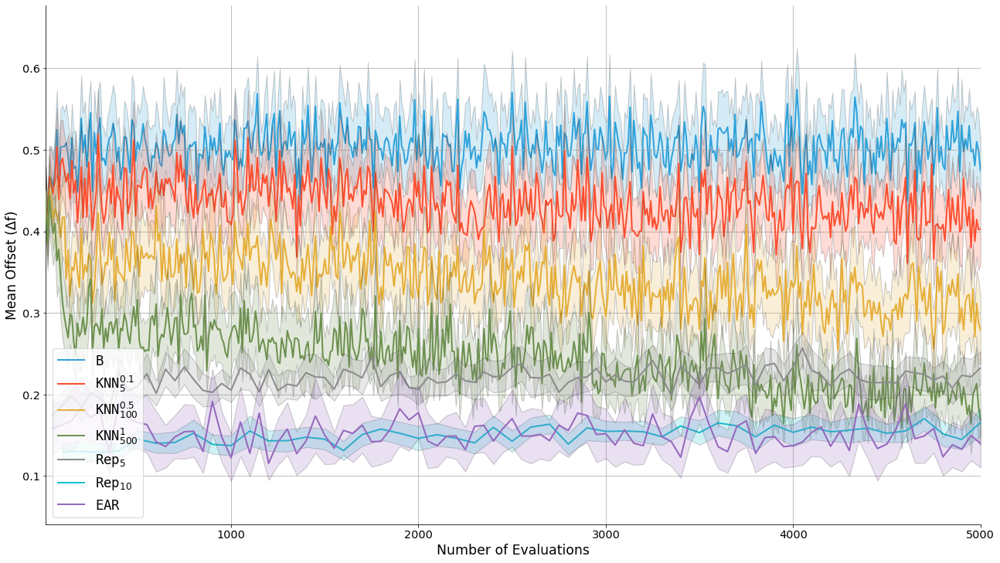

:Overlay
   .Area.I                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_B_right_curly_bracket                                                                                                         :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_5_right_curly_bracket_power_left_curly_bracket_0_full_stop_1_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_500_right_curly_bracket_power_left_curly_bracket_1_right_curly_bracket             :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_5_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                       :Curve   [n_eval]   (mean)
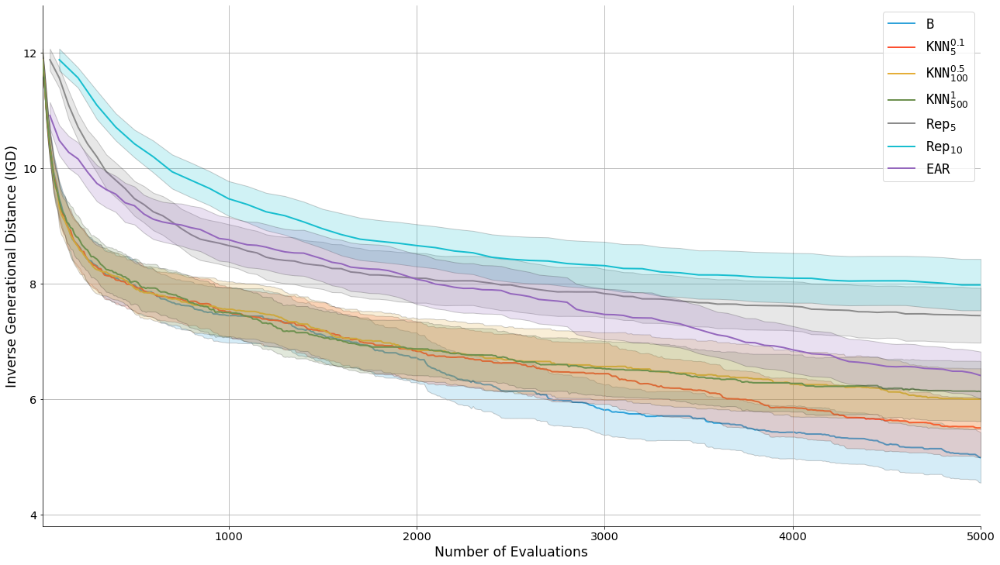

:Overlay
   .Area.I                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_B_right_curly_bracket                                                                                                         :Curve   [n_eval]   (mean)
   .Area.II                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_5_right_curly_bracket_power_left_curly_bracket_0_full_stop_1_right_curly_bracket   :Curve   [n_eval]   (mean)
   .Area.III                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_100_right_curly_bracket_power_left_curly_bracket_0_full_stop_5_right_curly_bracket :Curve   [n_eval]   (mean)
   .Area.IV                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_KNN_right_curly_bracket_left_curly_bracket_500_right_curly_bracket_power_left_curly_bracket_1_right_curly_bracket             :Curve   [n_eval]   (mean)
   .Area.V                                                                                                                                                                     :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_5_right_curly_bracket                                                              :Curve   [n_eval]   (mean)
   .Area.VI                                                                                                                                                                    :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_Rep_right_curly_bracket_left_curly_bracket_10_right_curly_bracket                                                             :Curve   [n_eval]   (mean)
   .Area.VII                                                                                                                                                                   :Area   [n_eval]   (c95_low,c95_high)
   .Curve.Reverse_over_mathtt_left_curly_bracket_EAR_right_curly_bracket                                                                                                       :Curve   [n_eval]   (mean)
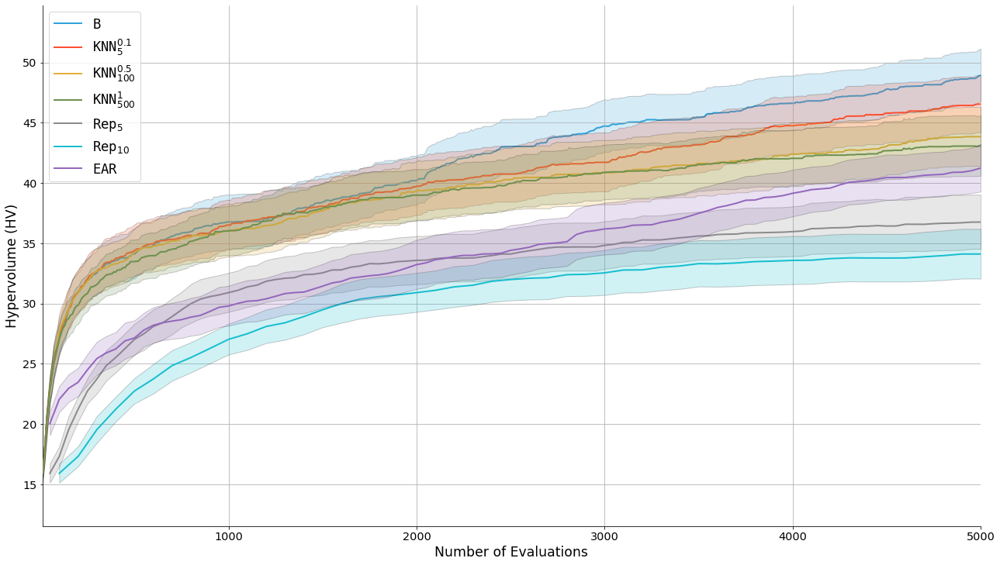

In [5]:
hvplot.extension('matplotlib')

# EAR does not have PIs in the same n_eval steps. So we need to "align" them 
ac = df[df.denoiser == "AccumulativeResampling"]
def get_adapted_AR_df(pop_size, base_problem, noise, granularity=50):
    new_run_dfs = []
    for n_run in ac.n_run.unique():
        run_df = ac[(ac.pop_size == pop_size) & (ac.base_problem == base_problem) & (ac.noise == noise) & (ac.n_run == n_run)].sort_values("n_eval")
        # print(len(run_df))
        new_run_rows = []
        for n_eval in range(granularity, 5001, granularity):
            if len(run_df[run_df.n_eval <= n_eval]) == 0:
                continue
            last_row_before_eval = run_df[run_df.n_eval <= n_eval].iloc[-1]
            last_row_before_eval["n_eval_old"] = last_row_before_eval.n_eval
            last_row_before_eval["n_eval"] = n_eval
            new_run_rows.append(last_row_before_eval)
        new_run_df = pd.DataFrame(new_run_rows)

        new_run_dfs.append(new_run_df)
    return pd.concat(new_run_dfs)

# get_adapted_AR_df(pop_size=10, base_problem="ZDT1", noise=0.1)

def area_plot(problem, pop_size, noise, denoiser, x, perf, smoothing_on, smoothing, area, show_all_runs):
    filtered = df[(df.base_problem == problem) & (df.noise == noise) & (df.denoiser == denoiser)]
    
    if denoiser == "AccumulativeResampling" and x == "n_eval":
        filtered = get_adapted_AR_df(base_problem=problem, pop_size=pop_size, noise=noise, granularity=50)
    
    one = filtered[filtered.pop_size == pop_size].pivot(index=x, columns="n_run", values=perf)
    num_cols = len(one.columns)

    ylabel_dict_long = {"DeltaF": "Mean Offset (Δf)", "IGD": "Inverse Generational Distance (IGD)", "HV": "Hypervolume (HV)"}
    ylabel_dict = {"DeltaF": "Δ f", "IGD": "IGD", "HV": "HV"}
    plot_options = dict(width=1800, height=1000, grid=True, xlabel="Number of Evaluations", ylabel=ylabel_dict_long.get(perf, perf), legend='bottom', fontsize={'title': 'xx-large', 'legend':'xx-large', 'ylabel': 'xx-large', 'xlabel': 'xx-large', 'ticks': 'x-large'})

    all_plots = one.hvplot(**plot_options)

    one["mean"] = one.mean(axis=1)
    one["smoothened"] = one["mean"].ewm(alpha=(1 - smoothing)).mean()
    one["c95_high"] = one['mean'] + 1.96* one.sem(axis=1)
    one['c95_low'] = one['mean'] - 1.96* one.sem(axis=1)
    if area == "std":
        one["c95_high"] = one['mean'] + one.std(axis=1)
        one['c95_low'] = one['mean'] - one.std(axis=1)



    # plot = all_plots
    plot = one.hvplot.area(**plot_options, y="c95_low", y2="c95_high", alpha=0.2, hover=False, label=False) #f"{denoiser}: {'Standard Error of Means (p=0.05)' if area == 'sem' else 'Standard deviation'}") 
    
    
    meanplot = one["mean"].hvplot(**plot_options, label=f"{denoiser_to_latex.get(denoiser, denoiser)}") #: Mean of {num_cols} runs")

    plot *= meanplot
    if smoothing_on:
        plot *= one["smoothened"].hvplot(line_dash="dotted", label=f"P{pop_size}: smoothened = {round(smoothing, 2)}", line_width=3, hover=False)
    if show_all_runs:
        plot = all_plots * plot

    return plot

problem = "MW1"
noise = 0.1
pop_size = 10

approaches = ["Noisy", "k5-MD0.1", "k100-MD0.5", "k500-MD1", "R5", "R10", "AccumulativeResampling"]

df_plots = [
    area_plot(problem=problem, pop_size=pop_size, noise=noise, denoiser=denoiser, x="n_eval", perf="DeltaF", smoothing_on=False, smoothing=0.95, area="sem", show_all_runs=False)
    for denoiser in approaches
]

igd_plots = [
    area_plot(problem=problem, pop_size=pop_size, noise=noise, denoiser=denoiser, x="n_eval", perf="IGD", smoothing_on=False, smoothing=0.95, area="sem", show_all_runs=False)
    for denoiser in approaches
]

hv_plots = [
    area_plot(problem=problem, pop_size=pop_size, noise=noise, denoiser=denoiser, x="n_eval", perf="HV", smoothing_on=False, smoothing=0.95, area="sem", show_all_runs=False)
    for denoiser in approaches
]

display(functools.reduce(lambda a, b: a * b, df_plots)) #.save("convergence_df.png"))
display(functools.reduce(lambda a, b: a * b, igd_plots)) #.save("convergence_igd.png"))
display(functools.reduce(lambda a, b: a * b, hv_plots)) #.save("convergence_hv.png"))

In [6]:
# Save to file
# hv.save(functools.reduce(lambda a, b: a * b, df_plots), paper_figures / "convergence_df.png", fmt="png")
# hv.save(functools.reduce(lambda a, b: a * b, igd_plots), paper_figures / "convergence_igd.png", fmt="png")
# hv.save(functools.reduce(lambda a, b: a * b, hv_plots), paper_figures / "convergence_hv.png", fmt="png")

# Tables for the paper

In [7]:
import time
start = time.time()
big_benchmarks_bgt_dfs = []
for budget in [1000, 2500, 5000]:
    big_benchmarks_bgt_pkl = Path(f"./big_benchmarks_df_{budget}.pkl")

    if big_benchmarks_bgt_pkl.exists():
        big_benchmarks_bgt_df = pd.read_pickle(big_benchmarks_bgt_pkl)
    else:
        big_benchmarks_bgt_df = df[df.n_eval >= budget].groupby(by=["denoiser", "base_problem", "noise", "n_run", "pop_size"]).first().reset_index()
        big_benchmarks_bgt_df["budget"] = budget
        big_benchmarks_bgt_df.to_pickle(big_benchmarks_bgt_pkl)
    # big_benchmarks_df
    big_benchmarks_bgt_dfs.append(big_benchmarks_bgt_df)

big_benchmarks_df = pd.concat(big_benchmarks_bgt_dfs)
big_benchmarks_df

,denoiser,base_problem,noise,n_run,pop_size,n_gen,n_eval,timedelta,algorithm,problem,DeltaF,HV,IGD,generation_time,budget
0,AccumulativeResampling,CTP1,0.1,1,10,496,1000,3.186883,arnsga2_10_elite,CTP1--L0.1,0.253108,13.101131,0.135612,0.005559,1000
1,AccumulativeResampling,CTP1,0.1,1,20,491,1000,3.197163,arnsga2_20_elite,CTP1--L0.1,0.235380,13.407829,0.096620,0.005926,1000
2,AccumulativeResampling,CTP1,0.1,1,50,476,1000,4.053429,arnsga2_50_elite,CTP1--L0.1,0.234551,13.378248,0.104182,0.008191,1000
3,AccumulativeResampling,CTP1,0.1,1,100,451,1000,5.174323,arnsga2_100_elite,CTP1--L0.1,0.183971,13.278351,0.094590,0.010771,1000
4,AccumulativeResampling,CTP1,0.1,2,10,496,1000,3.108880,arnsga2_10_elite,CTP1--L0.1,0.219941,13.247477,0.145757,0.005700,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
614395,k500-MD1,welded_beam,0.5,39,100,50,5000,22.452721,nsga2_100,welded_beam--L0.5-k500-MD1,1.425164,320.932354,2.897443,0.332037,5000
614396,k500-MD1,welded_beam,0.5,40,10,500,5000,26.919570,nsga2_10,welded_beam--L0.5-k500-MD1,1.036779,317.947293,2.863876,0.037444,5000
614397,k500-MD1,welded_beam,0.5,40,20,250,5000,22.161996,nsga2_20,welded_beam--L0.5-k500-MD1,0.993377,318.691019,2.529816,0.085212,5000
614398,k500-MD1,welded_beam,0.5,40,50,100,5000,24.376741,nsga2_50,welded_beam--L0.5-k500-MD1,1.338855,323.221984,5.052363,0.166568,5000


In [8]:
big_means_df = big_benchmarks_df.groupby(by=["denoiser", "base_problem", "noise", "pop_size", "budget"]).mean().reset_index()
big_means_df

/var/folders/2c/tjd11sg11_51m4m2_swttz1h0000gn/T/ipykernel_61954/2479646004.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  big_means_df = big_benchmarks_df.groupby(by=["denoiser", "base_problem", "noise", "pop_size", "budget"]).mean().reset_index()


,denoiser,base_problem,noise,pop_size,budget,n_gen,n_eval,timedelta,DeltaF,HV,IGD,generation_time
0,AccumulativeResampling,CTP1,0.1,10,1000,496.0,1000.0,3.207642,0.266033,12.936687,0.192999,0.006259
1,AccumulativeResampling,CTP1,0.1,10,2500,1246.0,2500.0,8.026502,0.273938,12.896311,0.211367,0.006377
2,AccumulativeResampling,CTP1,0.1,10,5000,2496.0,5000.0,16.374887,0.275738,12.783915,0.246759,0.006480
3,AccumulativeResampling,CTP1,0.1,20,1000,491.0,1000.0,3.196350,0.243084,13.169280,0.141936,0.006322
4,AccumulativeResampling,CTP1,0.1,20,2500,1241.0,2500.0,8.253166,0.247848,13.139157,0.160805,0.006626
...,...,...,...,...,...,...,...,...,...,...,...,...
46075,k500-MD1,welded_beam,0.5,50,2500,50.0,2500.0,12.822403,1.291202,321.306347,3.056301,0.269654
46076,k500-MD1,welded_beam,0.5,50,5000,100.0,5000.0,27.014766,1.230986,321.878283,2.903180,0.293551
46077,k500-MD1,welded_beam,0.5,100,1000,10.0,1000.0,4.860141,1.549453,319.715525,3.500981,0.496808
46078,k500-MD1,welded_beam,0.5,100,2500,25.0,2500.0,12.697957,1.517280,321.310059,3.054363,0.543276


In [9]:
big_means_df.denoiser.unique().tolist()

['AccumulativeResampling',
 'GPSS-mc2000',
 'GPSS-mc4000',
 'Noisy',
 'R10',
 'R100',
 'R5',
 'R50',
 'k10-MD0.1',
 'k10-MD0.25',
 'k10-MD0.5',
 'k10-MD1',
 'k100-MD0.1',
 'k100-MD0.25',
 'k100-MD0.5',
 'k100-MD1',
 'k20-MD0.1',
 'k20-MD0.25',
 'k20-MD0.5',
 'k20-MD1',
 'k5-MD0.1',
 'k5-MD0.25',
 'k5-MD0.5',
 'k5-MD1',
 'k50-MD0.1',
 'k50-MD0.25',
 'k50-MD0.5',
 'k50-MD1',
 'k500-MD0.1',
 'k500-MD0.25',
 'k500-MD0.5',
 'k500-MD1']

In [10]:
approach_columns = ["Noisy", "R5", "R10", "R50", "R100", "AccumulativeResampling", "GPSS-mc2000", "GPSS-mc4000"]
sort_cols = ["k", "resample", "MD"]
sort_list = [
 'k5-MD0.1',
 'k5-MD0.25',
 'k5-MD0.5',
 'k5-MD1',
 'k10-MD0.1',
 'k10-MD0.25',
 'k10-MD0.5',
 'k10-MD1',
 'k20-MD0.1',
 'k20-MD0.25',
 'k20-MD0.5',
 'k20-MD1',
 'k50-MD0.1',
 'k50-MD0.25',
 'k50-MD0.5',
 'k50-MD1',
 'k100-MD0.1',
 'k100-MD0.25',
 'k100-MD0.5',
 'k100-MD1',
 'k500-MD0.1',
 'k500-MD0.25',
 'k500-MD0.5',
 'k500-MD1']
# big_benchmarks_df[(big_benchmarks_df["resample"] == 0) & (big_benchmarks_df["k"] != 0)].sort_values(sort_cols)["denoiser"].unique()

effect_sizes = {"negligible": 1, "small":2, "medium": 3, "large": 4}
performance_indicators = ["DeltaF", "IGD", "HV"]

def wilcoxon_pi_table(means_dataframe, pis=performance_indicators, alpha_correct=192):
    approaches = means_dataframe.denoiser.unique()  # get a list of all approaches
    symbols_df = pd.DataFrame()  # the table we initialize
    for appA, appB in itertools.product(approaches, approach_columns):  # iterate over pairs of approaches
        if appA in approach_columns and appA != "baseline":
            continue
        if appA == appB:
            symbols_df.at[appA, appB] = ""
            continue
        # display(means_dataframe[means_dataframe.denoiser == appA])
        appA_df = means_dataframe[means_dataframe.denoiser == appA].sort_values(["budget", "base_problem", "noise", "pop_size"])
        appB_df = means_dataframe[means_dataframe.denoiser == appB].sort_values(["budget", "base_problem", "noise", "pop_size"])
        assert len(appA_df) == len(appB_df), f"both dataframes have the same length, currently it's {appA}: {len(appA_df)} vs {appB}: {len(appB_df)}"
        assert (appA_df["noise"].astype('string') + appA_df["pop_size"].astype('string')).tolist() == (appB_df["noise"].astype('string') + appB_df["pop_size"].astype('string')).tolist(), "sorting of dataframes is the same"
                
        pi_symbols = []
        for pi in pis:
            vd = None
            if ((appA_df[pi].reset_index() - appB_df[pi].reset_index()) == 0).all()[pi]:  # check if they are all zeros... 
                pi_symbols.append("=")
            elif wilcoxon(appA_df[pi], appB_df[pi])[1] >= (0.05 / alpha_correct):
                pi_symbols.append("=")
            else:
                vd = VD_A(list(appA_df[pi]), list(appB_df[pi]))
                if pi in ["HV", "perf_hv", "perf_ghv", "perf_rghv"]:
                    symbol = ("X" if vd[0] < 0.5 else "+") * effect_sizes[vd[1]]
#                     symbol = "x" if vd[0] < 0.5 else "+"
                else:
                    symbol = ("+" if vd[0] < 0.5 else "X") * effect_sizes[vd[1]]
#                     symbol = "+" if vd[0] < 0.5 else "x"

                pi_symbols.append(symbol)

        symbols_df.at[appA, appB] = "   ".join(pi_symbols)
    return (symbols_df.reindex(sort_list))


In [11]:

def tex_adapt_table(table, col_fix=True):
    tex = table.to_latex()
    
    # centre columns
    if re.search(r"\{l+\}", tex):
        orig_cols = re.search(r"\{l+\}", tex).group(0)
        cols = orig_cols.replace("l", "c")
        tex = tex.replace(orig_cols, cols)
    if col_fix:
        if "ccccccccccccccccccccccccc" in tex:
            tex = tex.replace("ccccccccccccccccccccccccc", "c|cccccccc|cccccccc|cccccccc")
        elif "lrrrrrrrrrrrrrrr" in tex:
            tex = tex.replace("lrrrrrrrrrrrrrrr", "c|rrrrr|rrrrr|rrrrr")
            
            
    
    # centre column group headlines
    tex = tex.replace("{l}", "{c}")
    
    tex = tex.replace("++++", f"\\cellcolor{{goodgreen!50}}\\textcolor{{goodgreen}}{{\\ding{{51}}\\ding{{51}}\\ding{{51}}}}")
    tex = tex.replace("+++", f"\\cellcolor{{goodgreen!30}}\\transparent{{0.75}}\\textcolor{{goodgreen}}{{\\ding{{51}}\\ding{{51}}}}")
    tex = tex.replace("++", f"\\cellcolor{{goodgreen!15}}\\transparent{{0.5}}\\textcolor{{goodgreen}}{{\\ding{{51}}}}")
    tex = tex.replace("+", f"\\transparent{{0.25}}\\textcolor{{goodgreen}}{{\\ding{{51}}}}")

    tex = tex.replace("=", f"\\textcolor{{gray}}{{\\ensuremath{{\\equiv}}}}")     

    tex = tex.replace("XXXX", f"\\cellcolor{{badred!50}}\\textcolor{{badred}}{{\\ding{{55}}\\ding{{55}}\\ding{{55}}}}")
    tex = tex.replace("XXX", f"\\cellcolor{{badred!30}}\\transparent{{0.75}}\\textcolor{{badred}}{{\\ding{{55}}\\ding{{55}}}}")
    tex = tex.replace("XX", f"\\cellcolor{{badred!15}}\\transparent{{0.5}}\\textcolor{{badred}}{{\\ding{{55}}}}")
    tex = tex.replace("X", f"\\transparent{{0.25}}\\textcolor{{badred}}{{\\ding{{55}}}}")
    
    # names
    tex = tex.replace("Noisy", f"\\baseline")
    tex = tex.replace("AccumulativeResampling", "\\EAR")
    tex = tex.replace("GPSS-mc2000", "\\GPSStwo")
    tex = tex.replace("GPSS-mc4000", "\\GPSSfour")
    
    tex = tex.replace(f"base\\_problem", "")
    
    # problem names
    tex = tex.replace("bnh", "BNH")
    tex = tex.replace("kursawe", "Kursawe")
    tex = tex.replace(f"OmniTest\_2", f"OmniTest$_2$")
    tex = tex.replace(f"OmniTest\_3", f"OmniTest$_3$")
    tex = tex.replace(f"OmniTest\_4", f"OmniTest$_4$")
    tex = tex.replace(f"OmniTest\_5", f"OmniTest$_5$")
    tex = tex.replace("osy", "OSY")
    tex = tex.replace("sympartrotated", "Sympart Rotated")
    tex = tex.replace("sympart", "Sympart")
    tex = tex.replace("tnk", "TNK")
    tex = tex.replace("truss2d", "Truss2D")
    tex = tex.replace("welded\\_beam", "Welded Beam")
    
    # colors
    tex = tex.replace("cellbetter", f"\\cellcolor{{goodgreen!30}}").replace("cellworse", f"\\cellcolor{{badred!30}}")
    # tex = tex.replace("cellyellow", f"\\cellcolor{{goodgreen!15}}")
    
    # 50% -> Median
    tex = tex.replace("50\\%", "median")
    
        # \repAppr{n}
    for n in [1, 5, 10, 50, 100][::-1]:
        tex = tex.replace(f"R{n}", f"\\repAppr{{{n}}}")
        
        # \knnAvg{\selectedK}{\maxDist}

    for k in [5, 10, 20, 50, 100, 500, 1000]:
        tex = tex.replace(f"k{k}-", f"\\knnAvg{{{k}}}")
        
    for md in [0.1, 0.25, 0.5, 1, 2]:
        tex = tex.replace(f"MD{md}", f"{{{md}}}")
        
    tex = tex.replace(f"IGD", "\IGD").replace(f"HV", "\HV").replace(f"DeltaF", "\meanErr")
    tex = tex.replace(f"perf\\_gigd", "\IGD").replace(f"perf\\_ghv", "\HV").replace(f"perf\\_df", "\meanErr")
    
    return tex

def write_table_to_file(table, filepath, col_fix=True):
    tex = tex_adapt_table(table, col_fix=col_fix)
    with open(filepath, 'w') as texfile:
        texfile.write(tex)
    return tex


In [12]:
%%time
data = big_means_df
tables = []
for pi, title in zip(performance_indicators, performance_indicators):
    print("total", pi)
    table = wilcoxon_pi_table(data, pis=[pi], alpha_correct=24*8)
    table.columns = pd.MultiIndex.from_product([[title], table.columns])
    tables.append(table)
display(pd.concat(tables, axis=1))
# print(tex_adapt_table(pd.concat(tables, axis=1)))
# tex = write_table_to_file(pd.concat(tables, axis=1), paper_tables/"total.tex")

slice_by_feature = {"noise": "Noise", "pop_size": "Pop Size", "budget": "Budget"} #, "base_problem": "Base Problem"}
for column, feature in slice_by_feature.items():
    print("Slicing by feature", feature)
    for feature_value in big_means_df[column].unique():
        print(feature, feature_value, "-->", f"{column}{feature_value}.tex")
        data = big_means_df[big_means_df[column] == feature_value]
        tables = []
        for pi, title in zip(performance_indicators, performance_indicators):
            table = wilcoxon_pi_table(data, pis=[pi], alpha_correct=24*8)
            table.columns = pd.MultiIndex.from_product([[title], table.columns])
            tables.append(table)
        display(pd.concat(tables, axis=1))
        # tex = write_table_to_file(pd.concat(tables, axis=1), paper_tables / f"{column}{feature_value}.tex")

total DeltaF
total IGD
total HV


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1         +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                           \
            GPSS-mc4000 Noisy  R5 R10  R50 R100 AccumulativeResampling   
k5-MD0.1           ++++     +  ++  ++  +++  +++                      +   
k5-MD0.25          ++++     +  ++  ++  +++  +++                      +   
k5-MD0.5           ++++     +  ++  ++  +++  +++                      +   
k5-MD1             ++++     +  ++  ++  +++  +++                      +   
k10-MD0.1          ++++     +  ++  ++  +++  +++                      +   
k10-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k10-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k10-MD1            ++++     +  ++  ++  +++  +++                      +   
k20-MD0.1          ++++     +  ++  ++  +++  +++                      +   
k20-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k20-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k20-MD1            ++++     +  ++  ++  +++  +++                      +   
k50-MD0.1          ++++     +  ++  ++  +++  +++                      +   
k50-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k50-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k50-MD1            ++++     +  ++  ++  +++  +++                      +   
k100-MD0.1         ++++     +  ++  ++  +++  +++                      +   
k100-MD0.25        ++++     +  ++  ++  +++  +++                      +   
k100-MD0.5         ++++     +  ++  ++  +++  +++                      +   
k100-MD1           ++++     +  ++  ++  +++  +++                      +   
k500-MD0.1         ++++     +  ++  ++  +++  +++                      +   
k500-MD0.25        ++++     +  ++  ++  +++  +++                      +   
k500-MD0.5         ++++     +  ++  ++  +++  +++                      +   
k500-MD1           ++++     =  ++  ++  +++  +++        

Slicing by feature Noise
Noise 0.1 --> noise0.1.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5      ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1        ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                            \
            GPSS-mc4000 Noisy  R5 R10  R50  R100 AccumulativeResampling   
k5-MD0.1           ++++     +  ++  ++  +++   +++                      +   
k5-MD0.25          ++++     +  ++  ++  +++  ++++                      +   
k5-MD0.5           ++++     +  ++  ++  +++  ++++                      +   
k5-MD1             ++++     +  ++  ++  +++  ++++                      +   
k10-MD0.1          ++++     +  ++  ++  +++   +++                      +   
k10-MD0.25         ++++     +  ++  ++  +++  ++++                      +   
k10-MD0.5          ++++     +  ++  ++  +++  ++++                      +   
k10-MD1            ++++     +  ++  ++  +++  ++++                      +   
k20-MD0.1          ++++     +  ++  ++  +++   +++                      +   
k20-MD0.25         ++++     +  ++  ++  +++  ++++                      +   
k20-MD0.5          ++++     +  ++  ++  +++  ++++                      +   
k20-MD1            ++++     +  ++  ++  +++  ++++                      +   
k50-MD0.1          ++++     +  ++  ++  +++   +++                      +   
k50-MD0.25         ++++     +  ++  ++  +++  ++++                      +   
k50-MD0.5          ++++     +  ++  ++  +++  ++++                      +   
k50-MD1            ++++     =  ++  ++  +++  ++++                      +   
k100-MD0.1         ++++     +  ++  ++  +++   +++                      +   
k100-MD0.25        ++++     +  ++  ++  +++  ++++                      +   
k100-MD0.5         ++++     +  ++  ++  +++  ++++                      +   
k100-MD1           ++++     =  ++  ++  +++  ++++                      +   
k500-MD0.1         ++++     +  ++  ++  +++   +++                      +   
k500-MD0.25        ++++     +  ++  ++  +++   +++                      +   
k500-MD0.5         ++++     =  ++  ++  +++   +++                      +   
k500-MD1           ++++     = 

Noise 0.25 --> noise0.25.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5      ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1        ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5    ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                           \
            GPSS-mc4000 Noisy  R5 R10  R50 R100 AccumulativeResampling   
k5-MD0.1           ++++     +   +  ++  +++  +++                      +   
k5-MD0.25          ++++     +  ++  ++  +++  +++                      +   
k5-MD0.5           ++++     +  ++  ++  +++  +++                      +   
k5-MD1             ++++     +  ++  ++  +++  +++                      +   
k10-MD0.1          ++++     +  ++  ++  +++  +++                      +   
k10-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k10-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k10-MD1            ++++     +  ++  ++  +++  +++                      +   
k20-MD0.1          ++++     +  ++  ++  +++  +++                      +   
k20-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k20-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k20-MD1            ++++     +  ++  ++  +++  +++                      +   
k50-MD0.1          ++++     +  ++  ++  +++  +++                      +   
k50-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k50-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k50-MD1            ++++     +  ++  ++  +++  +++                      +   
k100-MD0.1         ++++     +  ++  ++  +++  +++                      +   
k100-MD0.25        ++++     +  ++  ++  +++  +++                      +   
k100-MD0.5         ++++     +  ++  ++  +++  +++                      +   
k100-MD1           ++++     =  ++  ++  +++  +++                      +   
k500-MD0.1         ++++     +   +  ++  +++  +++                      +   
k500-MD0.25        ++++     +  ++  ++  +++  +++                      +   
k500-MD0.5         ++++     =  ++  ++  +++  +++                      +   
k500-MD1           ++++     =  ++  ++  +++  +++        

Noise 0.5 --> noise0.5.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5      ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1        ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++    XX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5     ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++    XX  XXXX  XXXX  XXXX                    XXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5    ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1      ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                           \
            GPSS-mc4000 Noisy  R5 R10  R50 R100 AccumulativeResampling   
k5-MD0.1           ++++     +   +  ++  +++  +++                      +   
k5-MD0.25          ++++     +   +  ++  +++  +++                      +   
k5-MD0.5           ++++     +  ++  ++  +++  +++                      +   
k5-MD1             ++++     +  ++  ++  +++  +++                      +   
k10-MD0.1          ++++     +   +  ++  +++  +++                      +   
k10-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k10-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k10-MD1            ++++     +  ++  ++  +++  +++                      +   
k20-MD0.1          ++++     +   +  ++  +++  +++                      +   
k20-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k20-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k20-MD1            ++++     +  ++  ++  +++  +++                      +   
k50-MD0.1          ++++     +   +  ++  +++  +++                      +   
k50-MD0.25         ++++     +  ++  ++  +++  +++                      +   
k50-MD0.5          ++++     +  ++  ++  +++  +++                      +   
k50-MD1            ++++     +  ++  ++  +++  +++                      +   
k100-MD0.1         ++++     +   +  ++  +++  +++                      +   
k100-MD0.25        ++++     +  ++  ++  +++  +++                      +   
k100-MD0.5         ++++     +  ++  ++  +++  +++                      +   
k100-MD1           ++++     =  ++  ++  +++  +++                      +   
k500-MD0.1         ++++     +   +  ++  +++  +++                      +   
k500-MD0.25        ++++     +   +  ++  +++  +++                      +   
k500-MD0.5         ++++     +   +  ++  +++  +++                      +   
k500-MD1           ++++     =   +  ++  +++  +++        

Slicing by feature Pop Size
Pop Size 10 --> pop_size10.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1         +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++   XXX  XXXX  XXXX  XXXX                    XXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                          \
            GPSS-mc4000 Noisy R5 R10  R50 R100 AccumulativeResampling   
k5-MD0.1           ++++     +  +   +  +++  +++                      +   
k5-MD0.25          ++++     +  +  ++  +++  +++                      +   
k5-MD0.5           ++++     +  +  ++  +++  +++                      +   
k5-MD1             ++++     +  +   +  +++  +++                      +   
k10-MD0.1          ++++     +  +   +  +++  +++                      +   
k10-MD0.25         ++++     +  +  ++  +++  +++                      +   
k10-MD0.5          ++++     +  +  ++  +++  +++                      +   
k10-MD1            ++++     +  +  ++  +++  +++                      +   
k20-MD0.1          ++++     +  +   +  +++  +++                      +   
k20-MD0.25         ++++     +  +  ++  +++  +++                      +   
k20-MD0.5          ++++     +  +  ++  +++  +++                      +   
k20-MD1            ++++     +  +  ++  +++  +++                      +   
k50-MD0.1          ++++     +  +   +  +++  +++                      +   
k50-MD0.25         ++++     +  +  ++  +++  +++                      +   
k50-MD0.5          ++++     +  +  ++  +++  +++                      +   
k50-MD1            ++++     +  +  ++  +++  +++                      +   
k100-MD0.1         ++++     +  +   +  +++  +++                      +   
k100-MD0.25        ++++     +  +  ++  +++  +++                      +   
k100-MD0.5         ++++     +  +  ++  +++  +++                      +   
k100-MD1           ++++     +  +  ++  +++  +++                      +   
k500-MD0.1         ++++     +  +   +  +++  +++                      +   
k500-MD0.25        ++++     +  +  ++  +++  +++                      +   
k500-MD0.5         ++++     +  +  ++  +++  +++                      +   
k500-MD1           ++++     =  +   +  +++  +++                      +   

      

Pop Size 20 --> pop_size20.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1        ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++    XX  XXXX  XXXX  XXXX                    XXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++   XXX  XXXX  XXXX  XXXX                    XXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                          \
            GPSS-mc4000 Noisy R5 R10  R50 R100 AccumulativeResampling   
k5-MD0.1           ++++     +  +  ++  +++  +++                      +   
k5-MD0.25          ++++     +  +  ++  +++  +++                      +   
k5-MD0.5           ++++     +  +  ++  +++  +++                      +   
k5-MD1             ++++     +  +  ++  +++  +++                      +   
k10-MD0.1          ++++     +  +  ++  +++  +++                      +   
k10-MD0.25         ++++     +  +  ++  +++  +++                      +   
k10-MD0.5          ++++     +  +  ++  +++  +++                      +   
k10-MD1            ++++     +  +  ++  +++  +++                      +   
k20-MD0.1          ++++     +  +  ++  +++  +++                      +   
k20-MD0.25         ++++     +  +  ++  +++  +++                      +   
k20-MD0.5          ++++     +  +  ++  +++  +++                      +   
k20-MD1            ++++     +  +  ++  +++  +++                      +   
k50-MD0.1          ++++     +  +  ++  +++  +++                      +   
k50-MD0.25         ++++     +  +  ++  +++  +++                      +   
k50-MD0.5          ++++     +  +  ++  +++  +++                      +   
k50-MD1            ++++     +  +  ++  +++  +++                      +   
k100-MD0.1         ++++     +  +  ++  +++  +++                      +   
k100-MD0.25        ++++     +  +  ++  +++  +++                      +   
k100-MD0.5         ++++     +  +  ++  +++  +++                      +   
k100-MD1           ++++     +  +  ++  +++  +++                      +   
k500-MD0.1         ++++     +  +  ++  +++  +++                      +   
k500-MD0.25        ++++     +  +  ++  +++  +++                      +   
k500-MD0.5         ++++     +  +  ++  +++  +++                      +   
k500-MD1           ++++     =  +  ++  +++  +++                      +   

      

Pop Size 50 --> pop_size50.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1        ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++    XX  XXXX  XXXX  XXXX                    XXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++   XXX  XXXX  XXXX  XXXX                    XXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                             \
            GPSS-mc4000 Noisy  R5 R10   R50  R100 AccumulativeResampling   
k5-MD0.1           ++++     +  ++  ++   +++  ++++                      +   
k5-MD0.25          ++++     +  ++  ++  ++++  ++++                      +   
k5-MD0.5           ++++     +  ++  ++  ++++  ++++                      +   
k5-MD1             ++++     +  ++  ++  ++++  ++++                      +   
k10-MD0.1          ++++     +  ++  ++   +++  ++++                      +   
k10-MD0.25         ++++     +  ++  ++  ++++  ++++                      +   
k10-MD0.5          ++++     +  ++  ++  ++++  ++++                      +   
k10-MD1            ++++     =  ++  ++  ++++  ++++                      +   
k20-MD0.1          ++++     +  ++  ++   +++  ++++                      +   
k20-MD0.25         ++++     +  ++  ++  ++++  ++++                      +   
k20-MD0.5          ++++     +  ++  ++  ++++  ++++                      +   
k20-MD1            ++++     =  ++  ++  ++++  ++++                      +   
k50-MD0.1          ++++     +  ++  ++   +++  ++++                      +   
k50-MD0.25         ++++     +  ++  ++  ++++  ++++                      +   
k50-MD0.5          ++++     =  ++  ++  ++++  ++++                      +   
k50-MD1            ++++     =  ++  ++  ++++  ++++                      +   
k100-MD0.1         ++++     +  ++  ++   +++  ++++                      +   
k100-MD0.25        ++++     +  ++  ++  ++++  ++++                      +   
k100-MD0.5         ++++     =  ++  ++  ++++  ++++                      +   
k100-MD1           ++++     =  ++  ++  ++++  ++++                      +   
k500-MD0.1         ++++     +  ++  ++   +++  ++++                      +   
k500-MD0.25        ++++     +  ++  ++   +++  ++++                      +   
k500-MD0.5         ++++     =  ++  ++   +++  ++++                      +   
k500-

Pop Size 100 --> pop_size100.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1         +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1       +++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                            \
            GPSS-mc4000 Noisy  R5  R10  R50 R100 AccumulativeResampling   
k5-MD0.1           ++++     =  ++  +++  +++  +++                      +   
k5-MD0.25          ++++     +  ++  +++  +++  +++                      +   
k5-MD0.5           ++++     +  ++  +++  +++  +++                      +   
k5-MD1             ++++     +  ++  +++  +++  +++                      +   
k10-MD0.1          ++++     =  ++  +++  +++  +++                      +   
k10-MD0.25         ++++     =  ++  +++  +++  +++                      +   
k10-MD0.5          ++++     =  ++  +++  +++  +++                      +   
k10-MD1            ++++     +  ++  +++  +++  +++                      +   
k20-MD0.1          ++++     =  ++  +++  +++  +++                      +   
k20-MD0.25         ++++     =  ++  +++  +++  +++                      +   
k20-MD0.5          ++++     =  ++  +++  +++  +++                      +   
k20-MD1            ++++     =  ++  +++  +++  +++                      +   
k50-MD0.1          ++++     =  ++  +++  +++  +++                      +   
k50-MD0.25         ++++     =  ++  +++  +++  +++                      +   
k50-MD0.5          ++++     =  ++  +++  +++  +++                      +   
k50-MD1            ++++     =  ++  +++  +++  +++                      +   
k100-MD0.1         ++++     =  ++  +++  +++  +++                      +   
k100-MD0.25        ++++     =  ++  +++  +++  +++                      +   
k100-MD0.5         ++++     =  ++  +++  +++  +++                      +   
k100-MD1           ++++     =  ++  +++  +++  +++                      +   
k500-MD0.1         ++++     =  ++  +++  +++  +++                      +   
k500-MD0.25        ++++     =  ++  +++  +++  +++                      +   
k500-MD0.5         ++++     =  ++  +++  +++  +++                      +   
k500-MD1           ++++     = 

Slicing by feature Budget
Budget 1000 --> budget1000.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1         +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1        +  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.1        +  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1        +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.1       +  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1       +  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                            \
            GPSS-mc4000 Noisy  R5  R10  R50 R100 AccumulativeResampling   
k5-MD0.1           ++++     +  ++  +++  +++  +++                      +   
k5-MD0.25          ++++     +  ++  +++  +++  +++                      +   
k5-MD0.5           ++++     +  ++  +++  +++  +++                      +   
k5-MD1             ++++     +  ++  +++  +++  +++                      +   
k10-MD0.1          ++++     +  ++  +++  +++  +++                      +   
k10-MD0.25         ++++     +  ++  +++  +++  +++                      +   
k10-MD0.5          ++++     +  ++  +++  +++  +++                      +   
k10-MD1            ++++     +  ++  +++  +++  +++                      +   
k20-MD0.1          ++++     +  ++  +++  +++  +++                      +   
k20-MD0.25         ++++     +  ++  +++  +++  +++                      +   
k20-MD0.5          ++++     +  ++  +++  +++  +++                      +   
k20-MD1            ++++     +  ++  +++  +++  +++                      +   
k50-MD0.1          ++++     +  ++  +++  +++  +++                      +   
k50-MD0.25         ++++     =  ++  +++  +++  +++                      +   
k50-MD0.5          ++++     =  ++  +++  +++  +++                      +   
k50-MD1            ++++     =  ++  +++  +++  +++                      +   
k100-MD0.1         ++++     +  ++  +++  +++  +++                      +   
k100-MD0.25        ++++     =  ++  +++  +++  +++                      +   
k100-MD0.5         ++++     =  ++  +++  +++  +++                      +   
k100-MD1           ++++     =  ++  +++  +++  +++                      +   
k500-MD0.1         ++++     +  ++  +++  +++  +++                      +   
k500-MD0.25        ++++     =  ++  +++  +++  +++                      +   
k500-MD0.5         ++++     =  ++   ++  +++  +++                      +   
k500-MD1           ++++     = 

Budget 2500 --> budget2500.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1        ++++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++    XX  XXXX  XXXX  XXXX                    XXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++    XX  XXXX  XXXX  XXXX                    XXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                            \
            GPSS-mc4000 Noisy  R5 R10  R50  R100 AccumulativeResampling   
k5-MD0.1           ++++     +   +  ++  +++   +++                      +   
k5-MD0.25          ++++     +  ++  ++  +++   +++                      +   
k5-MD0.5           ++++     +  ++  ++  +++   +++                      +   
k5-MD1             ++++     +  ++  ++  +++   +++                      +   
k10-MD0.1          ++++     +   +  ++  +++   +++                      +   
k10-MD0.25         ++++     +  ++  ++  +++   +++                      +   
k10-MD0.5          ++++     +  ++  ++  +++   +++                      +   
k10-MD1            ++++     +  ++  ++  +++   +++                      +   
k20-MD0.1          ++++     +   +  ++  +++   +++                      +   
k20-MD0.25         ++++     +  ++  ++  +++   +++                      +   
k20-MD0.5          ++++     +  ++  ++  +++   +++                      +   
k20-MD1            ++++     +  ++  ++  +++  ++++                      +   
k50-MD0.1          ++++     +   +  ++  +++   +++                      +   
k50-MD0.25         ++++     +  ++  ++  +++   +++                      +   
k50-MD0.5          ++++     +  ++  ++  +++   +++                      +   
k50-MD1            ++++     +  ++  ++  +++  ++++                      +   
k100-MD0.1         ++++     +   +  ++  +++   +++                      +   
k100-MD0.25        ++++     +  ++  ++  +++   +++                      +   
k100-MD0.5         ++++     +  ++  ++  +++   +++                      +   
k100-MD1           ++++     +  ++  ++  +++  ++++                      +   
k500-MD0.1         ++++     +   +  ++  +++   +++                      +   
k500-MD0.25        ++++     +   +  ++  +++   +++                      +   
k500-MD0.5         ++++     +   +  ++  +++   +++                      +   
k500-MD1           ++++     = 

Budget 5000 --> budget5000.tex


DeltaF                                                             \
             Noisy    R5   R10   R50  R100 AccumulativeResampling GPSS-mc2000   
k5-MD0.1        ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.25      +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD0.5       +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k5-MD1         +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD0.5     ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k10-MD1       ++++    XX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD0.5     ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k20-MD1       ++++    XX  XXXX  XXXX  XXXX                    XXX        ++++   
k50-MD0.1       ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.25     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD0.5     ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k50-MD1       ++++     X   XXX  XXXX  XXXX                    XXX        ++++   
k100-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.25    +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD0.5     +++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k100-MD1      ++++    XX   XXX  XXXX  XXXX                    XXX        ++++   
k500-MD0.1      ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.25     ++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD0.5     +++  XXXX  XXXX  XXXX  XXXX                   XXXX        ++++   
k500-MD1      ++++   XXX  XXXX  XXXX  XXXX                   XXXX        ++++   

                          IGD                                           \
            GPSS-mc4000 Noisy R5 R10  R50  R100 AccumulativeResampling   
k5-MD0.1           ++++     +  +  ++  +++   +++                      +   
k5-MD0.25          ++++     +  +  ++  +++   +++                      +   
k5-MD0.5           ++++     +  +  ++  +++  ++++                      +   
k5-MD1             ++++     +  +  ++  +++   +++                      +   
k10-MD0.1          ++++     +  +  ++  +++   +++                      +   
k10-MD0.25         ++++     +  +  ++  +++   +++                      +   
k10-MD0.5          ++++     +  +  ++  +++  ++++                      +   
k10-MD1            ++++     +  +  ++  +++   +++                      +   
k20-MD0.1          ++++     +  +  ++  +++   +++                      +   
k20-MD0.25         ++++     +  +  ++  +++   +++                      +   
k20-MD0.5          ++++     +  +  ++  +++  ++++                      +   
k20-MD1            ++++     +  +  ++  +++  ++++                      +   
k50-MD0.1          ++++     +  +  ++  +++   +++                      +   
k50-MD0.25         ++++     +  +  ++  +++  ++++                      +   
k50-MD0.5          ++++     +  +  ++  +++  ++++                      +   
k50-MD1            ++++     +  +  ++  +++  ++++                      +   
k100-MD0.1         ++++     +  +  ++  +++   +++                      +   
k100-MD0.25        ++++     +  +  ++  +++  ++++                      +   
k100-MD0.5         ++++     +  +  ++  +++  ++++                      +   
k100-MD1           ++++     +  +  ++  +++  ++++                      +   
k500-MD0.1         ++++     +  +  ++  +++   +++                      +   
k500-MD0.25        ++++     +  +  ++  +++   +++                      +   
k500-MD0.5         ++++     +  +  ++  +++  ++++                      +   
k500-MD1           ++++     =  +  ++  +++   +++        

CPU times: user 22.2 s, sys: 101 ms, total: 22.3 s
Wall time: 23 s


## Aggregate count kNN-Settings per Problems

In [ ]:
problem_dfs = {}
for base_problem in big_means_df.base_problem.unique():
    print(base_problem, end=", ")
    data = big_means_df[(big_means_df["base_problem"] == base_problem)]
    tables = []
    for pi, title in zip(performance_indicators, performance_indicators):
        table = wilcoxon_pi_table(data, pis=[pi], alpha_correct=192)
        table.columns = pd.MultiIndex.from_product([[title], table.columns])
        tables.append(table)
    pi_df = pd.concat(tables, axis=1)
    problem_dfs[base_problem] = pi_df

CTP1, CTP2, CTP3, CTP4, CTP5, CTP6, CTP7, CTP8, MW1, MW10, MW11, MW12, MW13, MW14, MW2, MW3, MW4, MW5, MW6, MW7, MW8, MW9, OmniTest_2, OmniTest_3, 

In [ ]:
agg_dfs = []
sum_dfs = []

pattern_list = [
    ["++++", "+++", "++"],
    ["+", "="],
    ["XXXX", "XXX", "XX", "X"],
]

for patterns in pattern_list:
    print("Patterns:", patterns)
    aggregateds = []
    summand_dfs = []

    for problem_name, problem_df in problem_dfs.items():
            # create the downward sum
        def value_counter(column):
            return sum([(1 if val in patterns else 0) for val in column])

        aggregated = problem_df.aggregate(value_counter, axis=0)
        aggregated["base_problem"] = problem_name
        aggregateds.append(aggregated)

        def cell_to_count(val):
            return 1 if val in patterns else 0

        summand_df = problem_df.applymap(cell_to_count)
        summand_dfs.append(summand_df)

    print("Count kNN Settings that are better than competitor")
    agg_df = pd.DataFrame(aggregateds).sort_values("base_problem", key=natsort.natsort_keygen(alg=natsort.IGNORECASE))
    agg_df = agg_df.set_index("base_problem").applymap(int)

    agg_dfs.append(agg_df)

    print("Per kNN settings check on how many problems it is better than competitor")
    from functools import reduce
    sum_df = reduce(lambda a, b: a.add(b), summand_dfs)
    sum_df = sum_df.applymap(int)

    sum_dfs.append(sum_df)
    
    # display(agg_df)
    # display(sum_df)


In [ ]:
agg_table = agg_dfs[0].applymap(lambda v: f"{v}").add(agg_dfs[1].applymap(lambda v: f" ({v})"))
sum_table = sum_dfs[0].applymap(lambda v: f"{v}").add(sum_dfs[1].applymap(lambda v: f" ({v})"))

# table formatting
agg_green = agg_dfs[0].applymap(lambda v: f"cellbetter" if v >= 13 else "")
agg_yellow = agg_dfs[0].add(agg_dfs[1]).applymap(lambda v: f"cellyellow" if v >= 13 else "")
agg_red = agg_dfs[2].applymap(lambda v: f"cellworse" if v >= 13 else "")
agg_format = agg_green.add(agg_red)

sum_green = sum_dfs[0].applymap(lambda v: f"cellbetter" if v >= 21 else "")
sum_yellow = sum_dfs[0].add(sum_dfs[1]).applymap(lambda v: f"cellyellow" if v >= 21 else "")
sum_red = sum_dfs[2].applymap(lambda v: f"cellworse" if v >= 21 else "")
sum_format = sum_green.add(sum_red)

# display(agg_format)

# tex = write_table_to_file(agg_format.add(agg_table).rename_axis(index=None), paper_tables / f"count_settings_for_problem.tex", col_fix=True)
# tex = write_table_to_file(sum_format.add(sum_table), paper_tables / f"count_problems_per_setting.tex", col_fix=True)

In [ ]:
display(agg_dfs[0].applymap(lambda v: f"{v}").add(agg_dfs[1].applymap(lambda v: f" ({v})")).rename_axis(index=None))  # .add(agg_dfs[2].applymap(lambda v: f" ({v})")))
display(sum_dfs[0].applymap(lambda v: f"{v}").add(sum_dfs[1].applymap(lambda v: f" ({v})")))  # .add(sum_dfs[2].applymap(lambda v: f" ({v})")))

# KNN vs KNN

In [ ]:
def wilcoxon_large_matrix(means_dataframe, pis=performance_indicators, alpha_correct=552):
    approaches = means_dataframe["denoiser"].unique()  # get a list of all approaches
    symbols_df = pd.DataFrame()  # the table we initialize
    for appA, appB in itertools.product(approaches, approaches):  # iterate over pairs of approaches
        if appA in approach_columns or appB in approach_columns:
            continue
        if appA == appB:
            symbols_df.at[appA, appB] = ""
            continue

        appA_df = means_dataframe[means_dataframe.denoiser == appA].sort_values(["budget", "base_problem", "noise", "pop_size"])
        appB_df = means_dataframe[means_dataframe.denoiser == appB].sort_values(["budget", "base_problem", "noise", "pop_size"])
        assert len(appA_df) == len(appB_df), f"both dataframes have the same length, currently it's {appA}: {len(appA_df)} vs {appB}: {len(appB_df)}"
        assert (appA_df["noise"].astype('string') + appA_df["pop_size"].astype('string')).tolist() == (appB_df["noise"].astype('string') + appB_df["pop_size"].astype('string')).tolist(), "sorting of dataframes is the same"
        
        pi_symbols = []
        for pi in pis:
            vd = None
            if ((appA_df[pi].reset_index() - appB_df[pi].reset_index()) == 0).all()[pi]:  # check if they are all zeros... 
                pi_symbols.append("=")
            elif wilcoxon(appA_df[pi], appB_df[pi])[1] >= (0.05 / alpha_correct):
                pi_symbols.append("=")
            else:
                vd = VD_A(list(appA_df[pi]), list(appB_df[pi]))
                if pi in ["HV", "perf_hv", "perf_ghv", "perf_rghv"]:
                    symbol = ("X" if vd[0] < 0.5 else "+") * effect_sizes[vd[1]]
#                     symbol = "x" if vd[0] < 0.5 else "+"
                else:
                    symbol = ("+" if vd[0] < 0.5 else "X") * effect_sizes[vd[1]]
#                     symbol = "+" if vd[0] < 0.5 else "x"

                pi_symbols.append(symbol)

        symbols_df.at[appA, appB] = "   ".join(pi_symbols)
    return(symbols_df.reindex(sort_list)[sort_list])

In [ ]:
data = big_means_df
print("total")
# fig = create_strip_plot(data.sort_values(sort_cols, ascending=False))
# fig.write_image(os.path.join(paper_figures, "total.png"), width=1400, height=800, scale=2)
tables = []
for pi, title in zip(["IGD", "HV", "DeltaF"], ["IGD", "HV", "meanErr"]):
    print("total", pi)
    table = wilcoxon_large_matrix(data, pis=[pi], alpha_correct=(24*23))
    # table.columns = pd.MultiIndex.from_product([[title], table.columns])
    display(table)
    tables.append(table)
    # tex = write_table_to_file(table, paper_tables / f"{pi}.tex", col_fix=False)

# Check average run time for approach and problem

In [ ]:
denoiser_order = ["Noisy"] \
    + [f"R{v}" for v in [5, 10, 50, 100]] \
    + [f"k{k}-MD{md}" for k, md in itertools.product([5, 10, 20, 50, 100], [0.1, 0.25, 0.5, 1])] \
    + ["AccumulativeResampling", "GPSS-mc2000", "GPSS-mc4000"]

stats_dfs = []

for bgt in [1000, 2500, 5000]:
    stat_df = big_benchmarks_df[big_benchmarks_df.budget == bgt].groupby(by=["denoiser"]).timedelta.describe(percentiles=[0.5]).drop(columns=["count"]).reindex(denoiser_order).round(2)
    stat_df.columns = pd.MultiIndex.from_product([[f"Budget {bgt}"], stat_df.columns])
    # display(stat_df)
    stats_dfs.append(stat_df)
    # 
all_stats = pd.concat(stats_dfs, axis=1).rename_axis(index=None)
# write_table_to_file(all_stats, paper_tables / f"runtimes.tex")
all_stats